**1.	Data Cleaning and Preparation:**

In [86]:
import pandas as pd
import numpy as np


In [87]:
df=pd.read_csv('Cardiotocographic.csv')
df

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,73.0,0.5,43.000000,2.4,64.0,0.999926,2.000000
1,132.000000,0.006380,0.000000,0.006380,0.003190,0.0,0.0,17.0,2.1,0.000000,10.4,130.0,0.000000,1.000000
2,133.000000,0.003322,0.000000,0.008306,0.003322,0.0,0.0,16.0,2.1,0.000000,13.4,130.0,0.000000,1.000000
3,134.000000,0.002561,0.000000,0.007742,0.002561,0.0,0.0,16.0,2.4,0.000000,23.0,117.0,1.000000,1.000000
4,131.948232,0.006515,0.000000,0.008143,0.000000,0.0,0.0,16.0,2.4,0.000000,19.9,117.0,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,140.000000,0.000000,0.961268,0.007426,0.000000,0.0,0.0,79.0,0.2,25.000000,7.2,40.0,0.000000,2.000000
2122,140.000000,0.000775,0.000000,0.006979,0.000000,0.0,0.0,78.0,0.4,22.000000,7.1,66.0,1.000000,2.000000
2123,140.000000,0.000980,0.000000,0.006863,0.000000,0.0,0.0,79.0,0.4,20.000000,6.1,67.0,1.000000,1.990464
2124,140.000000,0.000679,0.000000,0.006110,0.000000,0.0,0.0,78.0,0.4,27.000000,7.0,66.0,1.000000,2.000000


In [88]:
df.head()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,73.0,0.5,43.0,2.4,64.0,0.999926,2.0
1,132.000000,0.006380,0.0,0.006380,0.003190,0.0,0.0,17.0,2.1,0.0,10.4,130.0,0.000000,1.0
2,133.000000,0.003322,0.0,0.008306,0.003322,0.0,0.0,16.0,2.1,0.0,13.4,130.0,0.000000,1.0
3,134.000000,0.002561,0.0,0.007742,0.002561,0.0,0.0,16.0,2.4,0.0,23.0,117.0,1.000000,1.0
4,131.948232,0.006515,0.0,0.008143,0.000000,0.0,0.0,16.0,2.4,0.0,19.9,117.0,1.000000,1.0


<Axes: >

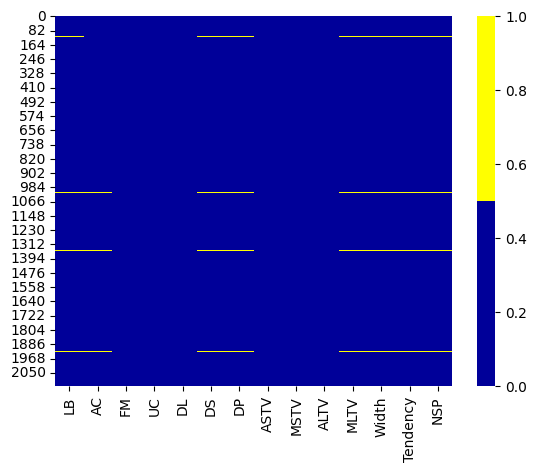

In [89]:
import seaborn as sns
cols = df.columns
colours = ['#000099', '#ffff00'] # specify the colours - yellow is missing. blue is not missing.
sns.heatmap(df[cols].isnull(),
            cmap=sns.color_palette(colours))

In [90]:
df.isnull().sum()

LB          21
AC          20
FM           0
UC           0
DL           0
DS          21
DP          21
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int64

In [91]:
df.fillna(df.median(),inplace=True)

In [92]:
df.isnull().sum()

LB          0
AC          0
FM          0
UC          0
DL          0
DS          0
DP          0
ASTV        0
MSTV        0
ALTV        0
MLTV        0
Width       0
Tendency    0
NSP         0
dtype: int64

In [93]:
df.dtypes

LB          float64
AC          float64
FM          float64
UC          float64
DL          float64
DS          float64
DP          float64
ASTV        float64
MSTV        float64
ALTV        float64
MLTV        float64
Width       float64
Tendency    float64
NSP         float64
dtype: object

In [94]:
for column in df.columns:
    df[column] = pd.to_numeric(df[column], errors='coerce')

In [95]:
from scipy import stats

z_scores = stats.zscore(df)
z_scores

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,-1.189842,-0.732909,-0.146533,-1.314683,-0.567147,-0.017643,-0.207542,1.382490,-0.736672,1.543111,-0.759876,-0.149738,1.067874,1.088038
1,-0.119536,0.726378,-0.146533,0.595558,0.387339,-0.017643,-0.207542,-1.594721,0.626938,-0.485186,0.274647,1.395551,-0.487138,-0.469638
2,-0.030344,0.027035,-0.146533,1.172279,0.426977,-0.017643,-0.207542,-1.647886,0.626938,-0.485186,0.662593,1.395551,-0.487138,-0.469638
3,0.058849,-0.147139,-0.146533,1.003470,0.199131,-0.017643,-0.207542,-1.647886,0.882615,-0.485186,1.904021,1.091176,1.067989,-0.469638
4,-0.124153,0.757276,-0.146533,1.123674,-0.567147,-0.017643,-0.207542,-1.647886,0.882615,-0.485186,1.503143,1.091176,1.067989,-0.469638
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,0.594002,-0.732909,14.089450,0.908809,-0.567147,-0.017643,-0.207542,1.701477,-0.992349,0.694057,-0.139162,-0.711661,-0.487138,1.088038
2122,0.594002,-0.555726,-0.146533,0.775114,-0.567147,-0.017643,-0.207542,1.648313,-0.821897,0.552547,-0.152094,-0.102911,1.067989,1.088038
2123,0.594002,-0.508651,-0.146533,0.740230,-0.567147,-0.017643,-0.207542,1.701477,-0.821897,0.458208,-0.281409,-0.079498,1.067989,1.073184
2124,0.594002,-0.577618,-0.146533,0.514830,-0.567147,-0.017643,-0.207542,1.648313,-0.821897,0.788396,-0.165025,-0.102911,1.067989,1.088038


In [96]:
df_no_outliers = df[(z_scores < 3).all(axis=1)]
df_no_outliers

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,73.0,0.5,43.000000,2.4,64.0,0.999926,2.000000
1,132.000000,0.006380,0.000000,0.006380,0.003190,0.0,0.0,17.0,2.1,0.000000,10.4,130.0,0.000000,1.000000
2,133.000000,0.003322,0.000000,0.008306,0.003322,0.0,0.0,16.0,2.1,0.000000,13.4,130.0,0.000000,1.000000
3,134.000000,0.002561,0.000000,0.007742,0.002561,0.0,0.0,16.0,2.4,0.000000,23.0,117.0,1.000000,1.000000
4,131.948232,0.006515,0.000000,0.008143,0.000000,0.0,0.0,16.0,2.4,0.000000,19.9,117.0,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2120,140.000000,0.000000,0.000000,0.004975,0.001244,0.0,0.0,77.0,0.7,17.000000,6.0,31.0,0.000000,1.000000
2122,140.000000,0.000775,0.000000,0.006979,0.000000,0.0,0.0,78.0,0.4,22.000000,7.1,66.0,1.000000,2.000000
2123,140.000000,0.000980,0.000000,0.006863,0.000000,0.0,0.0,79.0,0.4,20.000000,6.1,67.0,1.000000,1.990464
2124,140.000000,0.000679,0.000000,0.006110,0.000000,0.0,0.0,78.0,0.4,27.000000,7.0,66.0,1.000000,2.000000


In [97]:
import warnings
warnings.filterwarnings('ignore')
filtered_entries = (abs_z_scores < 3).all(axis=1)
df = df[filtered_entries]

print(df.shape)

(1869, 14)


**2.	Statistical Summary:**

In [98]:
summary=df.describe()
summary

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
count,1869.000000,1869.000000,1869.000000,1869.000000,1869.000000,1.869000e+03,1869.000000,1869.000000,1869.000000,1869.000000,1869.000000,1869.000000,1869.000000,1869.000000
mean,133.303462,0.003178,0.004240,0.004391,0.001732,1.186182e-08,0.000100,46.870868,1.283173,9.193894,8.320356,68.895751,0.329048,1.241862
std,9.899678,0.003770,0.013554,0.002904,0.002705,5.854019e-07,0.000404,16.834525,0.778099,16.574763,5.227228,37.614211,0.601753,0.529159
min,106.000000,-0.000185,-0.005106,-0.000132,-0.000124,-6.650000e-06,-0.000045,11.799846,0.200000,-1.043619,-0.200788,7.000000,-1.006614,0.967075
25%,126.000000,0.000000,0.000000,0.002002,0.000000,0.000000e+00,0.000000,32.000000,0.700000,0.000000,4.900000,37.000000,0.000000,1.000000
50%,133.000000,0.001668,0.000000,0.004556,0.000000,0.000000e+00,0.000000,48.000000,1.200000,0.000000,7.500000,66.000000,0.000000,1.000000
75%,141.000000,0.005650,0.002358,0.006579,0.003036,0.000000e+00,0.000000,61.000000,1.700000,11.000000,10.900000,98.000000,1.000000,1.000000
max,160.000000,0.016000,0.189320,0.013861,0.011837,6.323448e-06,0.002674,87.000000,4.800000,73.000000,29.500000,180.000000,1.023635,3.034545


**3.	Data Visualization:**

<Axes: >

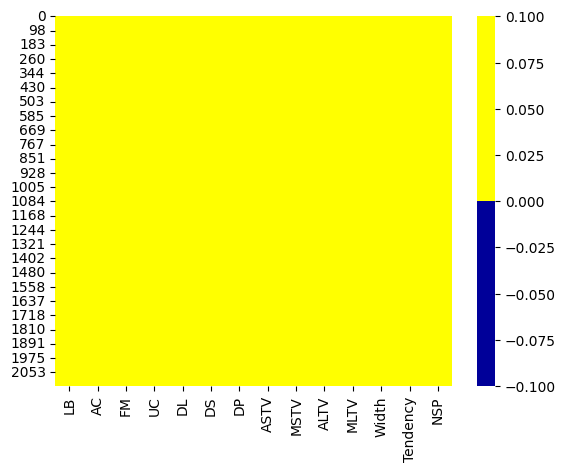

In [99]:
import seaborn as sns
cols = df.columns
colours = ['#000099', '#ffff00'] # specify the colours - yellow is missing. blue is not missing.
sns.heatmap(df[cols].isnull(),
            cmap=sns.color_palette(colours))

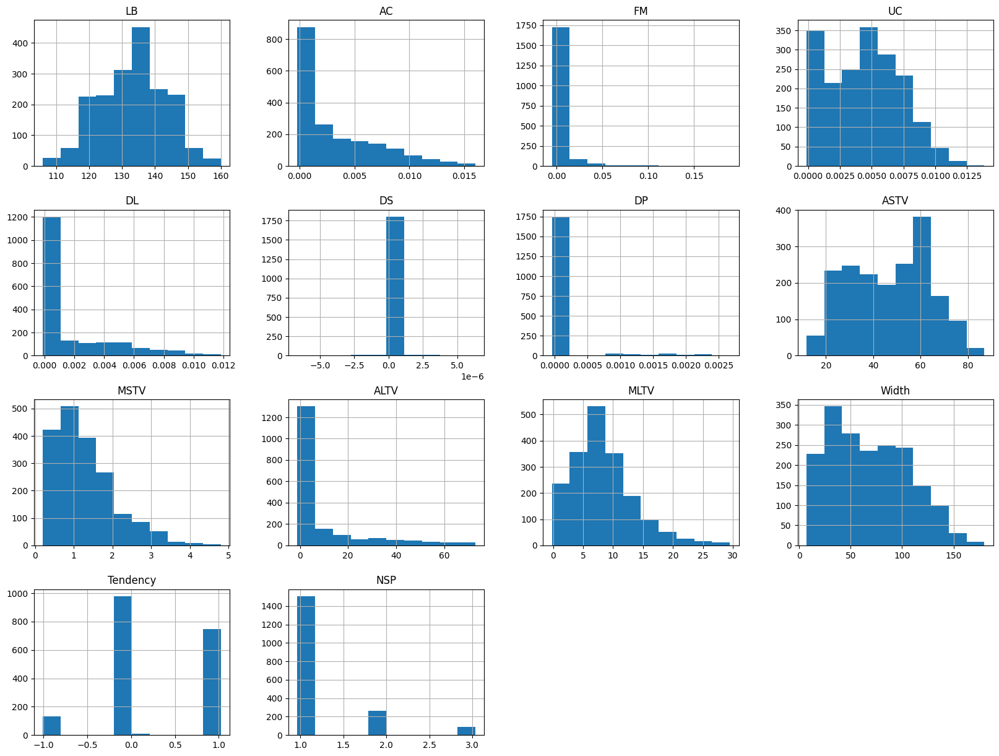

In [100]:
import matplotlib.pyplot as plt
df.hist(figsize=(20, 15))
plt.show()

<Axes: >

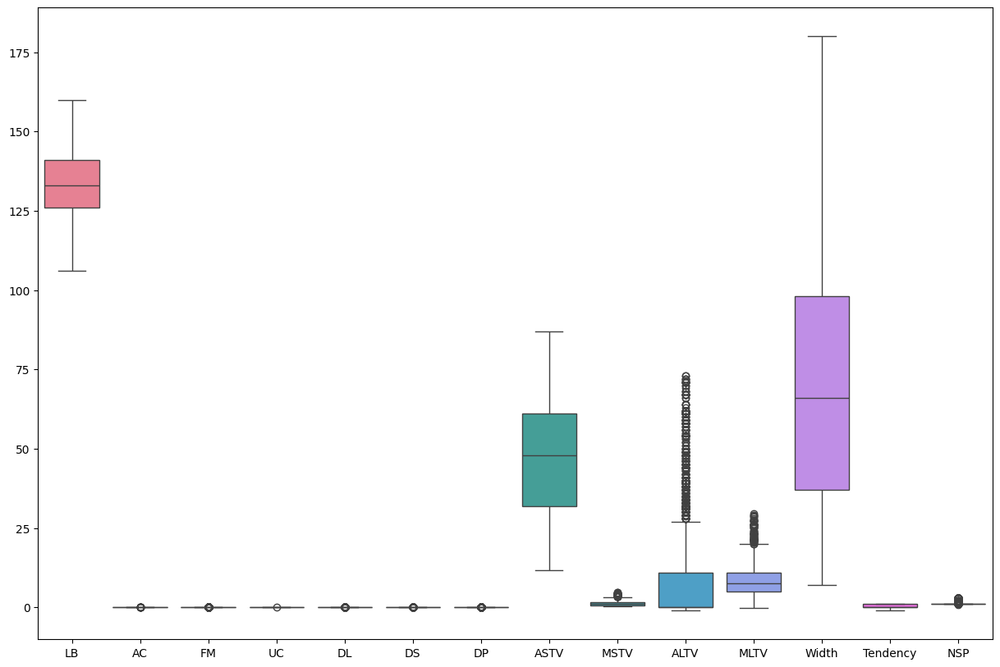

In [101]:
import seaborn as sns
plt.figure(figsize=(15, 10))
sns.boxplot(data=df)

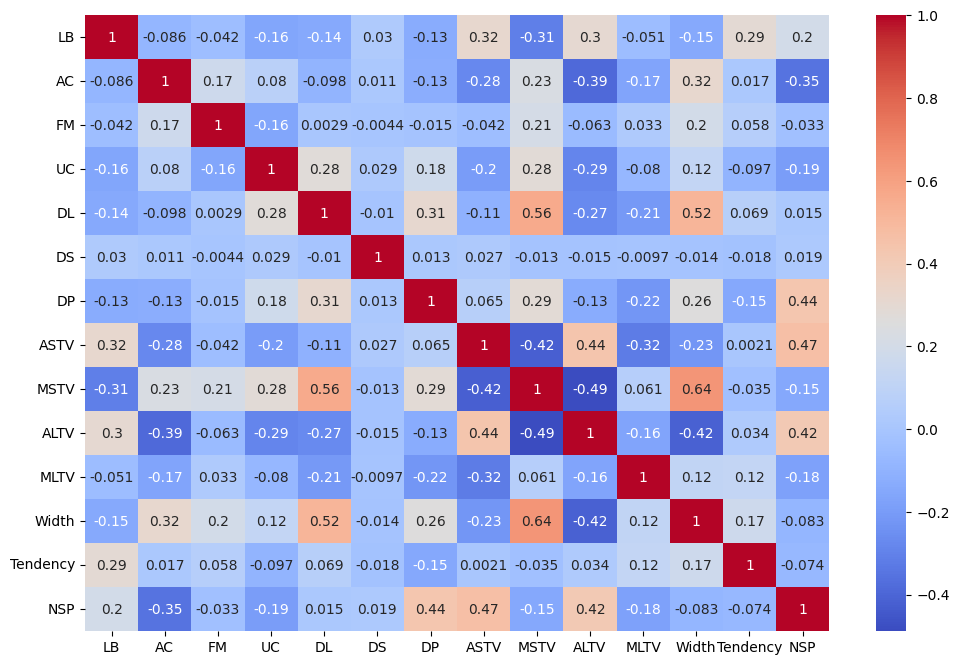

In [102]:
plt.figure(figsize=(12, 8))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

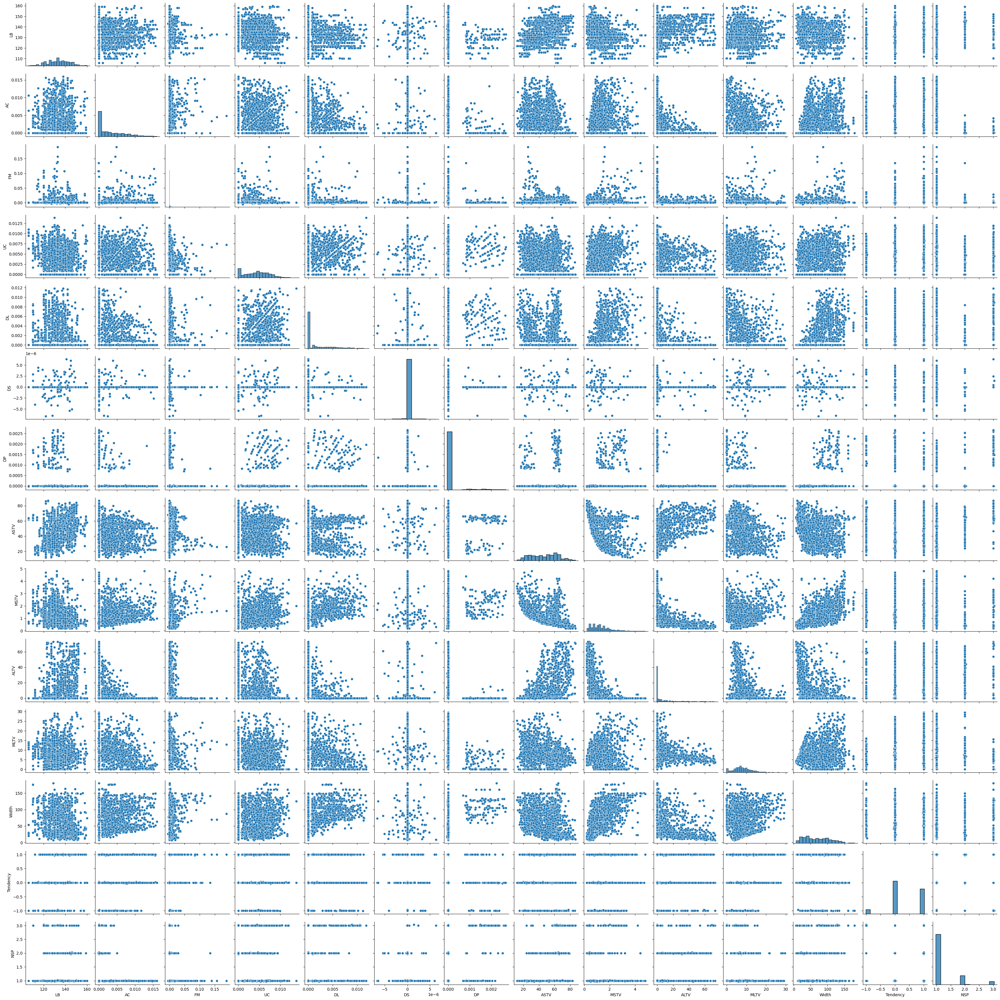

In [83]:
# Pair plots for relationships
sns.pairplot(df)
plt.show()

**4.	Pattern Recognition and Insights:**

In [84]:
# Correlation analysis
correlation_matrix = df.corr()

print("Correlations:")
print(correlation_matrix)

Correlations:
                LB        AC        FM        UC        DL        DS  \
LB        1.000000 -0.086312 -0.042002 -0.160908 -0.142871  0.030139   
AC       -0.086312  1.000000  0.169882  0.080253 -0.097710  0.011409   
FM       -0.042002  0.169882  1.000000 -0.158045  0.002855 -0.004361   
UC       -0.160908  0.080253 -0.158045  1.000000  0.276618  0.028794   
DL       -0.142871 -0.097710  0.002855  0.276618  1.000000 -0.010142   
DS        0.030139  0.011409 -0.004361  0.028794 -0.010142  1.000000   
DP       -0.129500 -0.125388 -0.014959  0.176754  0.309995  0.013134   
ASTV      0.317181 -0.275032 -0.041502 -0.203468 -0.108810  0.026784   
MSTV     -0.310611  0.230540  0.206354  0.279822  0.563550 -0.013095   
ALTV      0.303813 -0.388339 -0.062675 -0.285765 -0.271666 -0.015220   
MLTV     -0.050759 -0.166596  0.033133 -0.079793 -0.213164 -0.009659   
Width    -0.145604  0.315509  0.196127  0.118664  0.517035 -0.014026   
Tendency  0.294022  0.017183  0.058276 -0.096879  

In [85]:
significant_correlations = correlation_matrix[(correlation_matrix > 0.5) | (correlation_matrix < -0.5)]
print("Significant correlations (>|0.5|):")
print(significant_correlations)

Significant correlations (>|0.5|):
           LB   AC   FM   UC        DL   DS   DP  ASTV     MSTV  ALTV  MLTV  \
LB        1.0  NaN  NaN  NaN       NaN  NaN  NaN   NaN      NaN   NaN   NaN   
AC        NaN  1.0  NaN  NaN       NaN  NaN  NaN   NaN      NaN   NaN   NaN   
FM        NaN  NaN  1.0  NaN       NaN  NaN  NaN   NaN      NaN   NaN   NaN   
UC        NaN  NaN  NaN  1.0       NaN  NaN  NaN   NaN      NaN   NaN   NaN   
DL        NaN  NaN  NaN  NaN  1.000000  NaN  NaN   NaN  0.56355   NaN   NaN   
DS        NaN  NaN  NaN  NaN       NaN  1.0  NaN   NaN      NaN   NaN   NaN   
DP        NaN  NaN  NaN  NaN       NaN  NaN  1.0   NaN      NaN   NaN   NaN   
ASTV      NaN  NaN  NaN  NaN       NaN  NaN  NaN   1.0      NaN   NaN   NaN   
MSTV      NaN  NaN  NaN  NaN  0.563550  NaN  NaN   NaN  1.00000   NaN   NaN   
ALTV      NaN  NaN  NaN  NaN       NaN  NaN  NaN   NaN      NaN   1.0   NaN   
MLTV      NaN  NaN  NaN  NaN       NaN  NaN  NaN   NaN      NaN   NaN   1.0   
Width     NaN  Na

In [103]:
!pip install sweetviz
#pip install markupsafe
import sweetviz as sv
sweet_report = sv.analyze(df)
sweet_report.show_html('Cardiotocographic_report.html')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 32.6 MB/s eta 0:00:00


                                             |          | [  0%]   00:00 -> (? left)

Report Cardiotocographic_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [107]:
!pip install ydata_profiling
from ydata_profiling import ProfileReport

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 11.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 26.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 22.9 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=82c0553d4fa02c675d03eb76b19120f45acb777680e90b7c6a34f9939c841dcc
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [108]:

import pandas as pd
data1 = pd.read_csv("Cardiotocographic.csv")
EDA_report=ProfileReport(data1)
EDA_report.to_file(output_file='Cardiotocographic.html')
EDA_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]